# YOLOv3 on a Custom Dataset (darknet) — locally on macOS

The course lesson runs on Google Colab: mount Drive, check the CUDA/cuDNN
version, clone AlexeyAB's darknet, flip `GPU=1` and `OPENCV=1` in the Makefile,
`make`, download `yolov3.weights`, and detect. This notebook does the same thing
on this Mac.

## What had to change, and why

| Colab | Here | Reason |
| --- | --- | --- |
| `%tensorflow_version 1.x` | dropped | a Colab-only magic, and darknet does not use TensorFlow at all |
| `drive.mount('/content/gdrive')` | local paths | no Drive to mount |
| `!nvcc --version`, `!cat /usr/local/cuda/include/cudnn.h` | dropped | no CUDA on Apple Silicon |
| `sed -i 's/GPU=0/GPU=1/'` | **`GPU=0`** | CUDA does not exist on this machine; darknet has no Metal backend |
| `sed -i 's/OPENCV=0/OPENCV=1/'` | **`OPENCV=0`** | darknet's Makefile wants `pkg-config opencv`, which is not installed here |
| `!apt-get install vim`, `!apt install g++-5 gcc-5` | dropped | Ubuntu packages; macOS builds this with the clang already installed |
| `!wget ...` | `curl -L -O` | `wget` is not standard on macOS |
| `%cd {path}` | `os.chdir(path)` | `%cd` does **not** expand `{variables}` -- only `!` commands do, so `%cd "{DIR}"` would look for a directory literally named `{DIR}` |
| `from google.colab import files` | plain paths | no Colab file picker |
| `sed -i '...'` | a small Python edit | BSD `sed` on macOS needs `-i ''`; editing the file in Python avoids the trap entirely |

**Two consequences of `GPU=0`:** detection runs on CPU, so a single image takes
seconds rather than milliseconds, and *training* is impractical — see the
training section.

**One consequence of `OPENCV=0`:** `darknet detect` on images works fine (it
writes `predictions.jpg` itself), but darknet's own video/webcam demo will not.
The last section runs video through OpenCV's DNN module instead, which needs no
darknet build at all.

## The good news

The course's trained custom model is **already in this repo**:
`code/5-Object_Detection/darknetv3/backup/yolov3-robots_2000.weights` — YOLOv3
fine-tuned for 2 classes, `r2d2` and `c3po`. So you can skip straight to
detection without training anything.

## Paths

Everything is addressed absolutely, which replaces the notebook's `%cd` calls.

In [1]:
import os
import shutil
import subprocess
import sys
from pathlib import Path

MODULE_DIR   = Path.cwd()                                            # 54.Deep-Learning-...
DARKNETV3    = MODULE_DIR / "code" / "5-Object_Detection" / "darknetv3"
DARKNET_DIR  = DARKNETV3 / "darknet"                                 # the clone (created below)
DARKNET_BIN  = DARKNET_DIR / "darknet"

CUSTOM_CFG     = DARKNETV3 / "yolov3-robots.cfg"                     # classes=2, filters=21
CUSTOM_WEIGHTS = DARKNETV3 / "backup" / "yolov3-robots_2000.weights" # already trained
CUSTOM_NAMES   = DARKNETV3 / "robots-obj.names"                      # r2d2, c3po
IMAGES_DIR     = DARKNETV3 / "images"

assert DARKNETV3.is_dir(), f"not found: {DARKNETV3}"
for p in (CUSTOM_CFG, CUSTOM_WEIGHTS, CUSTOM_NAMES, IMAGES_DIR):
    print(f"{'OK ' if p.exists() else 'MISSING'}  {p.relative_to(MODULE_DIR)}")

print()
print("classes:", CUSTOM_NAMES.read_text().split())

OK   code/5-Object_Detection/darknetv3/yolov3-robots.cfg
OK   code/5-Object_Detection/darknetv3/backup/yolov3-robots_2000.weights
OK   code/5-Object_Detection/darknetv3/robots-obj.names
OK   code/5-Object_Detection/darknetv3/images

classes: ['r2d2', 'c3po']


## System check

The Colab equivalent of this was `!nvcc --version` and the `cudnn.h` grep. On a
Mac the interesting facts are the architecture and whether a compiler is
present.

In [2]:
import platform

print("macOS   :", platform.mac_ver()[0], "|", platform.machine())
for tool in ("git", "make", "clang++", "pkg-config"):
    print(f"{tool:9s}:", shutil.which(tool) or "NOT FOUND")

# darknet's Makefile links OpenCV through pkg-config. Without it, build OPENCV=0.
HAVE_OPENCV = False
if shutil.which("pkg-config"):
    HAVE_OPENCV = subprocess.run(["pkg-config", "--exists", "opencv4"]).returncode == 0
print("opencv4 for darknet:", HAVE_OPENCV)
print("(cv2 in this kernel is unrelated and always available)")

macOS   : 15.7.5 | arm64
git      : /opt/homebrew/bin/git
make     : /usr/bin/make
clang++  : /usr/bin/clang++
pkg-config: NOT FOUND
opencv4 for darknet: False
(cv2 in this kernel is unrelated and always available)


## Clone darknet

The course clones AlexeyAB's fork. Same here.

This is ~200 MB of repo plus another ~150 MB once built — check your free space
before running.

In [3]:
if DARKNET_DIR.exists():
    print("already cloned:", DARKNET_DIR)
else:
    !git clone https://github.com/AlexeyAB/darknet.git "{DARKNET_DIR}"

!ls "{DARKNET_DIR}" | head -20

already cloned: /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/darknet
3rdparty
CCM
CMakeLists.txt
DarknetConfig.cmake.in
Dockerfile.cpu
Dockerfile.gpu
LICENSE
Makefile
R2D2.avi
README.md
backup
build
cfg
cmake
darknet
darknet.py
darknet_images.py
darknet_video.py
data
docker-compose.yml


## Configure the Makefile

The course runs:

```bash
!sed -i 's/OPENCV=0/OPENCV=1/g' Makefile
!sed -i 's/GPU=0/GPU=1/g' Makefile
```

Both stay at **0** here: there is no CUDA on Apple Silicon, and no pkg-config
OpenCV. `AVX` and `OPENMP` stay off too — `AVX=1` emits `-mavx -msse4.2`, which
are x86 instruction sets that do not exist on ARM and would fail to compile.

Doing the edit in Python rather than with `sed -i` avoids the macOS/BSD
difference, where `sed -i` requires an explicit empty backup suffix.

In [4]:
import re

makefile = DARKNET_DIR / "Makefile"
text = makefile.read_text()

settings = {
    "GPU": 1 if False else 0,   # no CUDA on Apple Silicon
    "CUDNN": 0,
    "CUDNN_HALF": 0,
    "OPENCV": 1 if HAVE_OPENCV else 0,
    "AVX": 0,                   # x86-only instruction set
    "OPENMP": 0,                # needs libomp; not required
    "LIBSO": 0,
}

for key, value in settings.items():
    text, n = re.subn(rf"^{key}=\d+", f"{key}={value}", text, count=1, flags=re.M)
    if not n:
        print(f"note: {key} not found in Makefile")

makefile.write_text(text)

for line in text.splitlines()[:12]:
    if "=" in line and not line.startswith("#"):
        print(line)

GPU=0
CUDNN=0
CUDNN_HALF=0
OPENCV=0
AVX=0
OPENMP=0
LIBSO=0
ZED_CAMERA=0
ZED_CAMERA_v2_8=0


## Build

The course needs `apt install g++-5 gcc-5` because Colab's default compiler was
too new for CUDA 10. Nothing to install here — macOS already has clang, and with
`GPU=0` no nvcc is involved.

Expect warnings. Only errors matter.

In [5]:
os.chdir(DARKNET_DIR)
!make -j4 2>&1 | tail -25
os.chdir(MODULE_DIR)

  702 |     float recall75 = 0;
      |           ^~~~~~~~
./src/yolo_layer.c:703:11: warning: unused variable 'avg_cat' [-Wunused-variable]
  703 |     float avg_cat = 0;
      |           ^~~~~~~
./src/yolo_layer.c:704:11: warning: unused variable 'avg_obj' [-Wunused-variable]
  704 |     float avg_obj = 0;
      |           ^~~~~~~
./src/yolo_layer.c:705:11: warning: unused variable 'avg_anyobj' [-Wunused-variable]
  705 |     float avg_anyobj = 0;
      |           ^~~~~~~~~~
gcc -Iinclude/ -I3rdparty/stb/include -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -rdynamic -Ofast -c ./src/lstm_layer.c -o obj/lstm_layer.o
gcc -Iinclude/ -I3rdparty/stb/include -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -rdynamic -Ofast -c ./src/conv_lstm_layer.c -o obj/conv_lstm_layer.o
clang: warning: argument '-Ofast' is deprecated; use '-O3 -ffast-math' for the same behavior, or '-O3' to enable only conforming optimizations [-Wdeprecated-ofast]
clang: warnin

In [6]:
if DARKNET_BIN.exists():
    os.chmod(DARKNET_BIN, 0o755)
    print("built:", DARKNET_BIN)
    !"{DARKNET_BIN}" 2>&1 | head -3
else:
    print("BUILD FAILED - no darknet binary at", DARKNET_BIN)
    print("Re-run the make cell without the `| tail` to see the full error.")

built: /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/darknet/darknet
usage: /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/darknet/darknet <function>


## Detection with the custom robots model

This is the payoff, and it needs no download and no training — the cfg, the
names file and the trained weights are all already in the repo.

darknet resolves the paths inside a `.data` file relative to its working
directory, so write one with absolute paths.

In [7]:
robots_data = DARKNETV3 / "robots-obj-local.data"
robots_data.write_text(
    f"classes = 2\n"
    f"train = {DARKNETV3 / 'train-local.txt'}\n"
    f"valid = {DARKNETV3 / 'test-local.txt'}\n"
    f"names = {CUSTOM_NAMES}\n"
    f"backup = {DARKNETV3 / 'backup'}\n"
)
print(robots_data.read_text())

classes = 2
train = /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/train-local.txt
valid = /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/test-local.txt
names = /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/robots-obj.names
backup = /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/backup



### Utility function

The course's `show_img`. One change: `%matplotlib inline` is set at the top of
the cell rather than inside the function body, where a magic is easy to get
wrong.

In [8]:
%matplotlib inline
import cv2
import matplotlib.pyplot as plt


def show_img(path, scale=3):
    image = cv2.imread(str(path))
    if image is None:
        raise FileNotFoundError(path)

    height, width = image.shape[:2]
    resized_image = cv2.resize(image, (scale * width, scale * height),
                               interpolation=cv2.INTER_CUBIC)

    fig = plt.gcf()
    fig.set_size_inches(18, 10)
    plt.axis("off")
    plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
    plt.show()


# The Colab `files.upload()` / `files.download()` helpers have no local
# equivalent -- just read and write paths directly.

### Run it

The course form is `!./darknet detect cfg/yolov3.cfg yolov3.weights
data/person.jpg -dont-show`. For a custom model you need `detector test` with the
`.data` file, so the class names come from `robots-obj.names` rather than COCO's.

`-dont-show` matters here for the same reason it does on Colab: there is no
display attached, and without it darknet tries to open a window.

In [9]:
TEST_IMAGE = IMAGES_DIR / "000000.jpg"

os.chdir(DARKNET_DIR)
!"{DARKNET_BIN}" detector test "{robots_data}" "{CUSTOM_CFG}" "{CUSTOM_WEIGHTS}" \
    "{TEST_IMAGE}" -dont-show -thresh 0.3
os.chdir(MODULE_DIR)

 GPU isn't used 
 OpenCV isn't used - data augmentation will be slow 
mini_batch = 1, batch = 64, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 128 0.001 BF
   9 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
  10 conv    128 

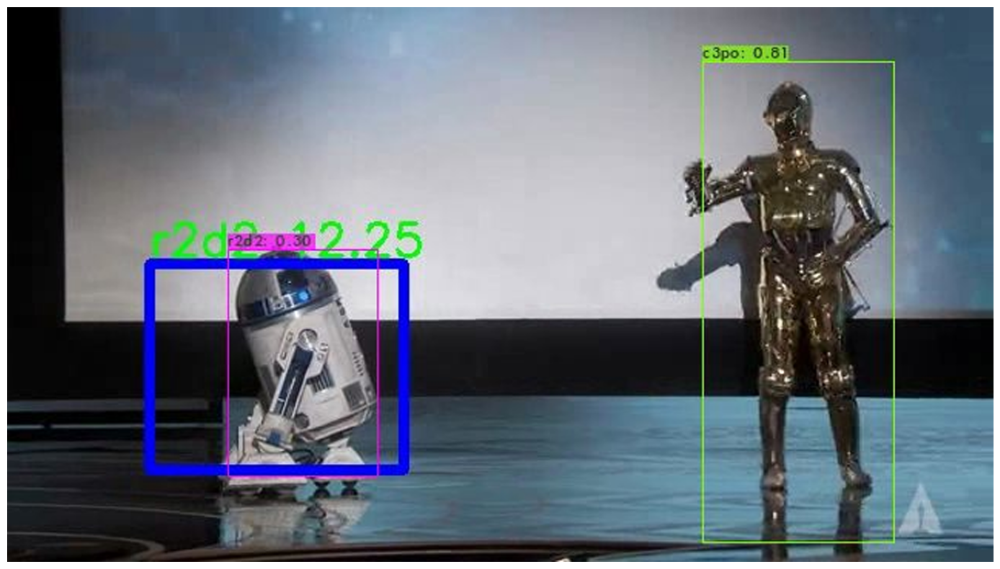

In [10]:
show_img(DARKNET_DIR / "predictions.jpg", scale=2)

### A few more images

 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/images/000010.jpg: Predicted in 2879.621000 milli-seconds.
r2d2: 100%
r2d2: 99%


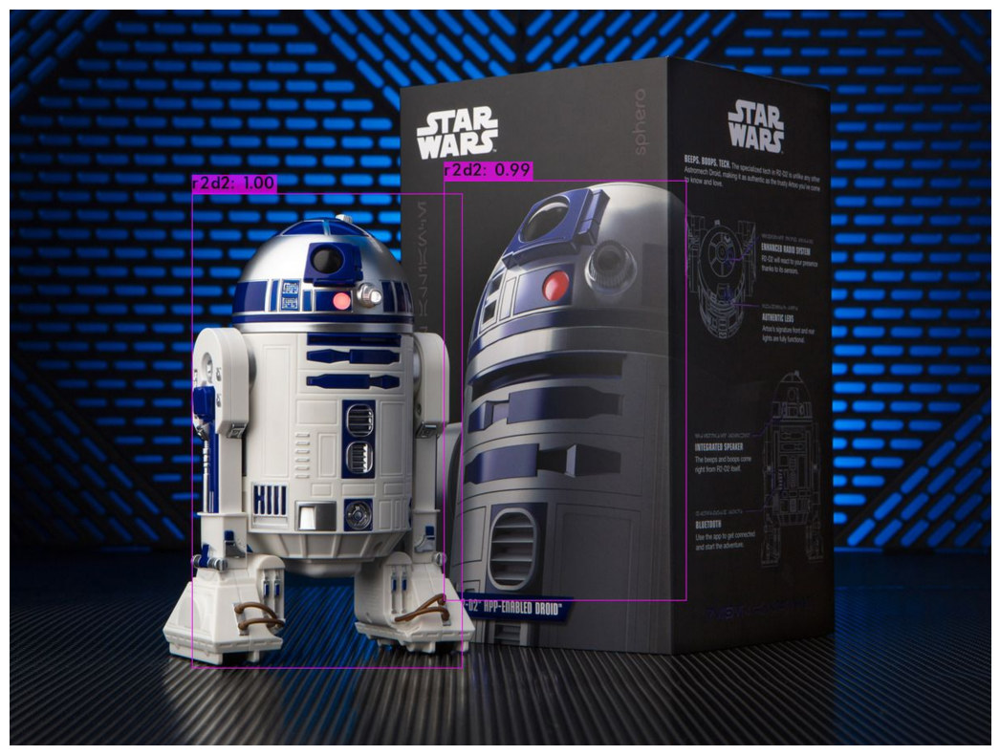

 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/images/000100.jpg: Predicted in 2921.357000 milli-seconds.
r2d2: 53%
r2d2: 100%


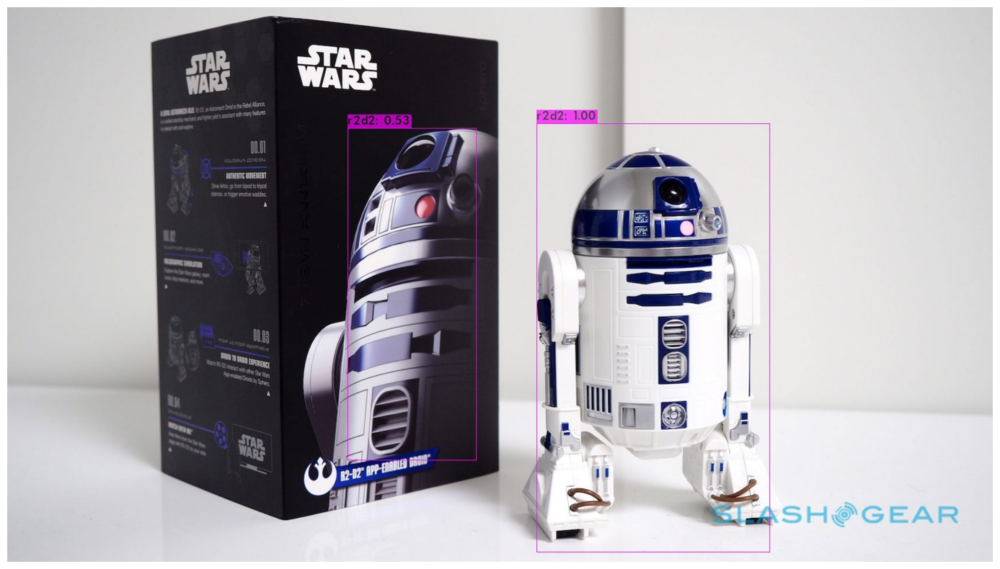

 Detection layer: 82 - type = 28 
 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/images/000160.jpg: Predicted in 3028.271000 milli-seconds.
r2d2: 100%


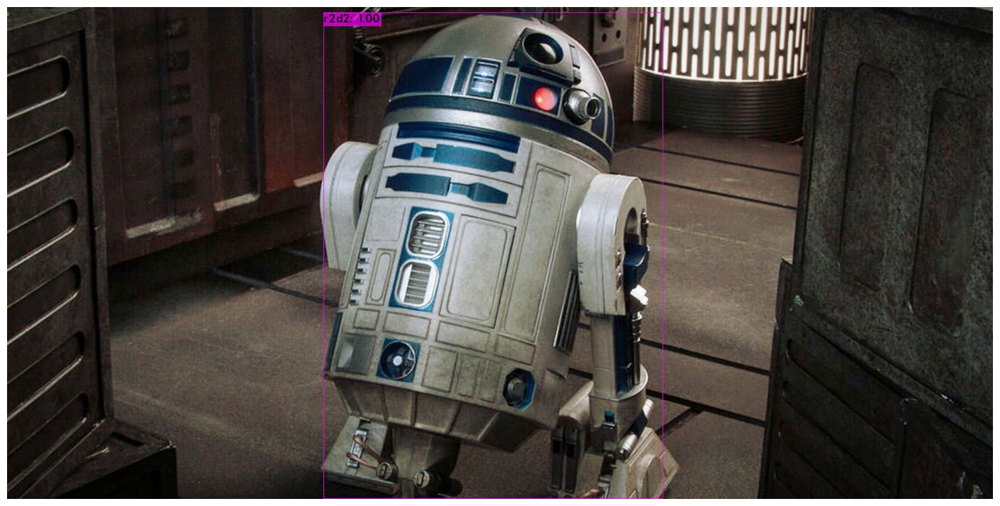

In [11]:
samples = ["000010.jpg", "000100.jpg", "000160.jpg"]

for name in samples:
    img = IMAGES_DIR / name
    if not img.exists():
        print("skip (missing):", name)
        continue
    os.chdir(DARKNET_DIR)
    !"{DARKNET_BIN}" detector test "{robots_data}" "{CUSTOM_CFG}" "{CUSTOM_WEIGHTS}" \
        "{img}" -dont-show -thresh 0.3 2>/dev/null | tail -5
    os.chdir(MODULE_DIR)
    show_img(DARKNET_DIR / "predictions.jpg", scale=2)

## Optional: COCO YOLOv3 on the sample images

The course's `!wget https://pjreddie.com/media/files/yolov3.weights` and
`./darknet detect cfg/yolov3.cfg yolov3.weights data/person.jpg -dont-show`.

**This downloads 237 MB.** Skip it unless you want the 80-class COCO model — the
custom robots model above needs nothing extra.

In [12]:
DOWNLOAD_COCO_WEIGHTS = False    # set True to fetch 237 MB

coco_weights = DARKNET_DIR / "yolov3.weights"

if DOWNLOAD_COCO_WEIGHTS and not coco_weights.exists():
    os.chdir(DARKNET_DIR)
    !curl -L -O https://pjreddie.com/media/files/yolov3.weights
    os.chdir(MODULE_DIR)

print("present" if coco_weights.exists() else "not downloaded", "->", coco_weights)

not downloaded -> /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/darknet/yolov3.weights


In [13]:
if coco_weights.exists():
    os.chdir(DARKNET_DIR)
    !"{DARKNET_BIN}" detect cfg/yolov3.cfg yolov3.weights data/person.jpg -dont-show
    os.chdir(MODULE_DIR)
    show_img(DARKNET_DIR / "predictions.jpg", scale=2)
else:
    print("Set DOWNLOAD_COCO_WEIGHTS = True in the previous cell first.")

Set DOWNLOAD_COCO_WEIGHTS = True in the previous cell first.


## Optional: training on your own dataset

The course trains with:

```bash
!./darknet detector train robots-obj.data yolov3-robots.cfg darknet53.conv.74
```

**Do not expect this to finish on this machine.** With `GPU=0`, YOLOv3 training
is roughly a thousand times slower than on the Tesla K80 the lesson uses — the
2000 iterations behind `yolov3-robots_2000.weights` would take weeks of CPU
time. The trained weights are already in `backup/`, so there is nothing to gain.

The cell below only fixes up the dataset lists, which is worth doing anyway:
`train.txt` and `test.txt` in the repo point at `img/000000.jpg`, but the images
actually live in `images/`. It rewrites both with absolute paths.

You would also need `darknet53.conv.74` (the pretrained backbone, 155 MB), which
was removed during the disk cleanup:

```bash
curl -O https://pjreddie.com/media/files/darknet53.conv.74
```

In [14]:
def rewrite_list(src_name, dst_name):
    src = DARKNETV3 / src_name
    if not src.exists():
        print("missing:", src)
        return
    lines = []
    for line in src.read_text().split():
        candidate = IMAGES_DIR / Path(line).name
        if candidate.exists():
            lines.append(str(candidate))
    (DARKNETV3 / dst_name).write_text("\n".join(lines) + "\n")
    print(f"{dst_name}: {len(lines)} images")


rewrite_list("train.txt", "train-local.txt")
rewrite_list("test.txt", "test-local.txt")

# The training command, for reference. Uncomment only if you mean it.
# os.chdir(DARKNET_DIR)
# !"{DARKNET_BIN}" detector train "{robots_data}" "{CUSTOM_CFG}" darknet53.conv.74 -dont_show
# os.chdir(MODULE_DIR)

train-local.txt: 180 images
test-local.txt: 33 images


## Video, driven by the darknet binary

**Why this section changed.** It originally used
`cv2.dnn.readNetFromDarknet(...)`. That fails here:

```
AttributeError: module 'cv2.dnn' has no attribute 'readNetFromDarknet'
```

This environment has **OpenCV 5.0.0**, and OpenCV 5 removed the legacy model
importers — Darknet, Caffe and Torch are all gone from `cv2.dnn`, which now
reads only ONNX, TFLite, TensorFlow and OpenVINO. (There is also a version
clash worth knowing about: both `opencv-python 5.0.0.93` and
`opencv-python-headless 4.14.0.94` are installed and both provide `cv2`; the 5.x
one currently wins.)

So instead of a second inference engine, this drives the darknet binary that was
just built. `darknet detector test` reads image paths from **stdin**, so one
process handles every frame — the 107-layer model is loaded once, not per frame
— and `-ext_output` makes it print box coordinates:

```
images/000000.jpg: Predicted in 2345.5 milli-seconds.
r2d2: 100%	(left_x:  323   top_y:  142   width:  906   height: 1229)
```

Parse those, draw with `cv2`, write the video. This needs no `pip install`, and
works with the `OPENCV=0` darknet build because darknet never touches the video
itself.

*The alternative*, if you would rather have the `cv2.dnn` route back, is to pin
OpenCV below 5 — `uv add 'opencv-python>=4.10,<5'`. Nothing else in this
notebook needs it.

In [15]:
import re
import subprocess
import tempfile

PRED_RE = re.compile(r"^(?P<path>.+?): Predicted in [\d.]+ milli-seconds\.")
BOX_RE = re.compile(
    r"^(?P<label>\S+): (?P<conf>\d+)%\s*"
    r"\(left_x:\s*(?P<x>-?\d+)\s+top_y:\s*(?P<y>-?\d+)\s+"
    r"width:\s*(?P<w>-?\d+)\s+height:\s*(?P<h>-?\d+)\)")


def darknet_detect(image_paths, thresh=0.3):
    """Run darknet once over many images.

    Returns {image_path: [(label, confidence, x, y, w, h), ...]}.
    darknet takes the paths on stdin, so the model is loaded a single time.
    """
    image_paths = [str(p) for p in image_paths]
    proc = subprocess.run(
        [str(DARKNET_BIN), "detector", "test",
         str(robots_data), str(CUSTOM_CFG), str(CUSTOM_WEIGHTS),
         "-dont_show", "-ext_output", "-thresh", str(thresh)],
        input="\n".join(image_paths) + "\n",
        capture_output=True, text=True, cwd=str(DARKNET_DIR))

    results = {p: [] for p in image_paths}
    current = None
    for raw in proc.stdout.splitlines():
        line = raw.strip()
        # the prompt is printed without a newline, so it can prefix a real line
        if line.startswith("Enter Image Path:"):
            line = line[len("Enter Image Path:"):].strip()

        m = PRED_RE.match(line)
        if m:
            current = m.group("path")
            results.setdefault(current, [])
            continue

        m = BOX_RE.match(line)
        if m and current is not None:
            results[current].append((
                m.group("label"), int(m.group("conf")) / 100,
                int(m.group("x")), int(m.group("y")),
                int(m.group("w")), int(m.group("h"))))

    return results


COLORS = {"r2d2": (0, 0, 255), "c3po": (0, 255, 0)}   # BGR


def draw(image_bgr, detections):
    out = image_bgr.copy()
    for label, confidence, x, y, w, h in detections:
        color = COLORS.get(label, (255, 0, 0))
        cv2.rectangle(out, (x, y), (x + w, y + h), color, 3)
        cv2.putText(out, f"{label} {confidence * 100:.0f}%", (x, max(y - 8, 15)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
    return out


print("darknet binary:", DARKNET_BIN.exists())

darknet binary: True


### On a single image

A quick check that the parsing lines up with what you saw from the CLI above.

000000.jpg -> [('r2d2', 1.0, 323, 142, 906, 1229)]


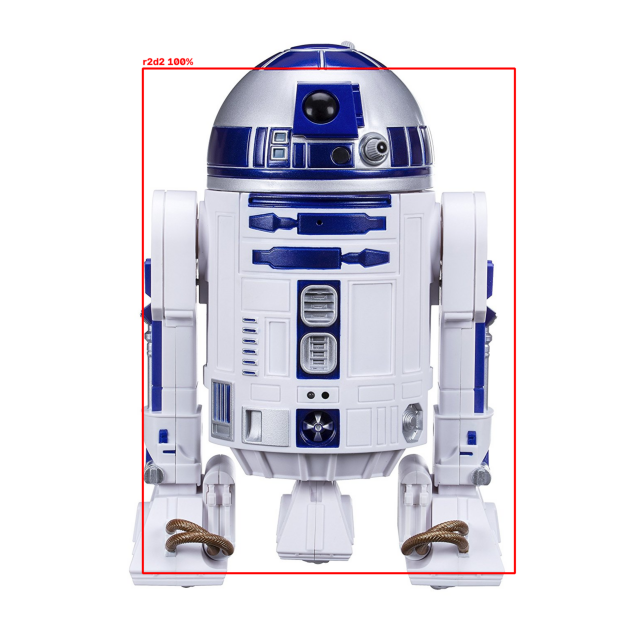

In [16]:
detections = darknet_detect([TEST_IMAGE])
for path, boxes in detections.items():
    print(Path(path).name, "->", boxes)

img = cv2.imread(str(TEST_IMAGE))
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(draw(img, detections[str(TEST_IMAGE)]), cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

### On a video

Frames are written to a temporary folder, run through darknet in one batch, then
re-assembled. The temp folder is deleted afterwards.

**This is slow.** CPU inference is about **2.3 seconds per frame** on this
machine, so 40 frames takes roughly a minute and a half. Raise `MAX_FRAMES`
knowingly — the whole 2451-frame clip would take over an hour.

Note the clip in this repo is *already annotated*, an output from an earlier
darknet run with boxes burned into the pixels, so you will see two sets of
boxes. Point `VIDEO_IN` at a clean clip for a proper result.

### Making the video playable in the notebook

`IPython.display.Video` renders an HTML5 `<video>` element, and browsers
decode **H.264** only. OpenCV's usual `mp4v` fourcc writes MPEG-4 Part 2
(`codec_name=mpeg4`), which writes a perfectly valid file that VLC plays
and the notebook shows as a blank player. `avc1` requests H.264 instead,
and `ensure_h264` re-encodes with ffmpeg if that ever falls back.

In [17]:
import shutil as _shutil
import subprocess as _subprocess

# HTML5 <video> (what IPython.display.Video uses) decodes H.264 only. OpenCV's
# usual 'mp4v' fourcc writes MPEG-4 Part 2, which produces a file that saves
# fine and plays in VLC but shows a blank player in the notebook. 'avc1' asks
# FFMPEG for H.264 instead.
FOURCC = cv2.VideoWriter_fourcc(*"avc1")


def ensure_h264(path):
    """Re-encode to H.264 if the file is not already playable in a browser.

    A no-op when 'avc1' worked. Needs ffmpeg only in the fallback case.
    """
    path = str(path)
    probe = _shutil.which("ffprobe")
    if probe:
        codec = _subprocess.run(
            [probe, "-v", "error", "-select_streams", "v:0",
             "-show_entries", "stream=codec_name", "-of", "csv=p=0", path],
            capture_output=True, text=True).stdout.strip()
        if codec == "h264":
            return path
        print(f"codec is {codec!r}, re-encoding to h264 ...")

    ffmpeg = _shutil.which("ffmpeg")
    if not ffmpeg:
        print("ffmpeg not found -- install it (brew install ffmpeg) if the "
              "player below stays blank")
        return path

    tmp = path + ".h264.mp4"
    _subprocess.run(
        [ffmpeg, "-y", "-v", "error", "-i", path,
         "-c:v", "libx264", "-pix_fmt", "yuv420p",
         # libx264 requires even dimensions
         "-vf", "scale=trunc(iw/2)*2:trunc(ih/2)*2",
         "-movflags", "+faststart", tmp],
        check=True)
    _shutil.move(tmp, path)
    return path


In [18]:
VIDEO_IN   = DARKNETV3 / "R2D2.avi"
VIDEO_OUT  = MODULE_DIR / "videos_out" / "R2D2-yolov3-robots.mp4"
MAX_FRAMES = 40           # ~2.3 s/frame on CPU
FRAME_STEP = 10           # take every Nth frame, to cover more of the clip

VIDEO_OUT.parent.mkdir(exist_ok=True)

cap = cv2.VideoCapture(str(VIDEO_IN))
if not cap.isOpened():
    raise RuntimeError(f"cannot open {VIDEO_IN}")

width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps    = cap.get(cv2.CAP_PROP_FPS) or 20.0

tmpdir = Path(tempfile.mkdtemp(prefix="yolov3_frames_"))
frame_paths, index = [], 0

try:
    while len(frame_paths) < MAX_FRAMES:
        ok, frame = cap.read()
        if not ok:
            break
        if index % FRAME_STEP == 0:
            p = tmpdir / f"{len(frame_paths):05d}.jpg"
            cv2.imwrite(str(p), frame)
            frame_paths.append(p)
        index += 1
    cap.release()

    print(f"extracted {len(frame_paths)} frames -> running darknet "
          f"(~{len(frame_paths) * 2.3 / 60:.1f} min)")
    detections = darknet_detect(frame_paths)

    writer = cv2.VideoWriter(str(VIDEO_OUT), FOURCC,
                             fps / FRAME_STEP, (width, height))
    hits = 0
    for p in frame_paths:
        boxes = detections.get(str(p), [])
        hits += len(boxes)
        writer.write(draw(cv2.imread(str(p)), boxes))
    writer.release()
    ensure_h264(VIDEO_OUT)

    print(f"wrote {VIDEO_OUT} ({len(frame_paths)} frames, {hits} detections)")
finally:
    shutil.rmtree(tmpdir, ignore_errors=True)   # keep the disk clean

extracted 40 frames -> running darknet (~1.5 min)
wrote /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/videos_out/R2D2-yolov3-robots.mp4 (40 frames, 24 detections)


In [19]:
from IPython.display import Video

Video(str(VIDEO_OUT.relative_to(MODULE_DIR)), embed=True, width=720)

## Webcam

Three things make a notebook webcam fail on macOS, and all three are handled
below:

1. **The first frames are black.** After `VideoCapture(0)` the camera needs a
   moment to expose. On this machine the first ~5 reads come back as
   correctly-sized, entirely black images — read one immediately and you get a
   black picture and conclude the model is broken. `open_camera` polls until a
   frame actually has content.
2. **`cv2.imshow` opens a native window.** From a Jupyter kernel on macOS that
   window is often unresponsive or never appears, because the kernel is not a
   GUI app with a proper event loop. These cells draw the frames *inline* in the
   notebook output instead, so no window is involved.
3. **The camera stays locked if the loop is interrupted.** Every cell releases
   the device in a `finally`, so pressing stop and re-running works instead of
   failing with a busy device.

**Permission:** macOS must grant Camera access to the app running the kernel —
VS Code, Terminal, or whichever program you launched Jupyter from — under
*System Settings > Privacy & Security > Camera*. If it was never granted, macOS
does not raise an error; it just hands back black frames forever. That is what
the check below detects and reports.

In [20]:
import time

from IPython.display import display, clear_output, Image as IPyImage


def open_camera(index=0, width=1280, height=720,
                settle_seconds=1.5, warmup_seconds=6.0):
    """Open the camera and return (capture, first_usable_frame).

    Two separate problems are handled here, measured on this machine:

    * Auto-exposure. The first frames are pure black (mean 0.00), then ramp
      2 -> 50 over about 1.3s before levelling off near 53. Reading one frame
      straight after VideoCapture() gives you a black image, which looks like a
      broken model rather than a camera still opening its shutter. So discard
      frames for `settle_seconds` first.
    * Missing permission. macOS raises no error when Camera access was never
      granted -- it returns correctly-sized frames that are *exactly* zero,
      forever. That is why the test below is "not pure black" rather than a
      brightness threshold: a dark room still carries sensor noise, so it
      passes, while a permission failure does not.
    """
    backend = cv2.CAP_AVFOUNDATION if sys.platform == "darwin" else cv2.CAP_ANY
    cap = cv2.VideoCapture(index, backend)
    cap.set(cv2.CAP_PROP_FRAME_WIDTH, width)
    cap.set(cv2.CAP_PROP_FRAME_HEIGHT, height)

    if not cap.isOpened():
        cap.release()
        raise RuntimeError(
            f"cannot open camera {index}. Close any other app using it "
            "(Photo Booth, Zoom, FaceTime) and try again.")

    started = time.time()

    while time.time() - started < settle_seconds:      # let exposure settle
        cap.read()

    while time.time() - started < warmup_seconds:      # then demand real pixels
        ok, frame = cap.read()
        if ok and frame is not None and frame.mean() > 0.5:
            return cap, frame

    cap.release()
    raise RuntimeError(
        f"camera {index} opened, but every frame was pure black for "
        f"{warmup_seconds:.0f}s.\n"
        "On macOS that means Camera permission was never granted to the app "
        "running this kernel -- grant it under System Settings > Privacy & "
        "Security > Camera, then restart the kernel. macOS reports no error "
        "in this case, it simply returns black frames.")


def show_inline(frame_bgr, max_width=720):
    """Draw a BGR frame in the cell output, replacing the previous one."""
    h, w = frame_bgr.shape[:2]
    if w > max_width:
        frame_bgr = cv2.resize(frame_bgr, (max_width, int(h * max_width / w)))
    ok, buf = cv2.imencode(".jpg", frame_bgr)      # imencode wants BGR
    if ok:
        clear_output(wait=True)
        display(IPyImage(data=buf.tobytes()))

### Check the camera first

In [21]:
# Camera self-test. Reports only metadata -- it does not display or save a frame.
try:
    cap, frame = open_camera()
    cap.release()
    print(f"camera OK  frame={frame.shape}  brightness={frame.mean():.1f}")
except RuntimeError as exc:
    print("camera NOT usable:\n", exc)

camera OK  frame=(720, 1280, 3)  brightness=98.5


### Detection from the camera

In [22]:
RUN_WEBCAM = False      # set True to capture
N_SHOTS = 5             # darknet needs ~2.3 s per frame on CPU
GAP_SECONDS = 1.0       # pause between shots, so they are not near-identical

if RUN_WEBCAM:
    cap, frame = open_camera()
    tmpdir = Path(tempfile.mkdtemp(prefix="yolov3_cam_"))
    try:
        shots = []
        for i in range(N_SHOTS):
            ok, frame = cap.read()
            if not ok:
                break
            p = tmpdir / f"cam{i:02d}.jpg"
            cv2.imwrite(str(p), frame)
            shots.append(p)
            show_inline(frame)                 # live preview while capturing
            time.sleep(GAP_SECONDS)
        cap.release()

        print(f"captured {len(shots)} frames, running darknet "
              f"(~{len(shots) * 2.3:.0f}s) ...")
        detections = darknet_detect(shots)

        clear_output(wait=True)
        for p in shots:
            boxes = detections.get(str(p), [])
            plt.figure(figsize=(10, 6))
            plt.imshow(cv2.cvtColor(draw(cv2.imread(str(p)), boxes), cv2.COLOR_BGR2RGB))
            plt.title(f"{p.name}: {len(boxes)} detection(s)")
            plt.axis("off")
            plt.show()
    except KeyboardInterrupt:
        print("interrupted")
    finally:
        cap.release()                          # safe to call twice
        cv2.destroyAllWindows()
        shutil.rmtree(tmpdir, ignore_errors=True)
else:
    print("Set RUN_WEBCAM = True to capture from the camera.")

Set RUN_WEBCAM = True to capture from the camera.


---

# The course's dataset workflow, locally

Everything above used absolute paths. The lesson instead **stages a working
directory** and then runs darknet with short relative paths — the "Loading data
to VM" section, where each file is copied out of Google Drive:

```python
!cp -r "/content/gdrive/My Drive/Colab/darknet/images"           ./img
!cp -r "/content/gdrive/My Drive/Colab/darknet/yolov3-robots.cfg" ./cfg/yolov3-robots.cfg
!cp -r "/content/gdrive/My Drive/Colab/darknet/train.txt"        ./
!cp -r "/content/gdrive/My Drive/Colab/darknet/test.txt"         ./
!cp -r "/content/gdrive/My Drive/Colab/darknet/robots-obj.data"  ./
!cp -r "/content/gdrive/My Drive/Colab/darknet/robots-obj.names" ./
!cp -r "/content/gdrive/My Drive/Colab/darknet/darknet53.conv.74" ./
!cp -r "/content/gdrive/My Drive/Colab/darknet/yolov3-robots_last.weights" ./backup
```

There is no Drive to copy from here, and no reason to duplicate 200 MB of
weights, so the next cell builds the same layout with **symlinks** instead. The
result is identical from darknet's point of view, and the course's commands then
work verbatim.

## Why the folder is called `img` and not `images`

This looks like an arbitrary choice in the lesson, and it is not.

darknet derives each label file from its image path by string substitution: it
swaps the extension `.jpg` -> `.txt`, **and** replaces a `/images/` path
component with `/labels/`. The course keeps each `000000.jpg` next to its
`000000.txt` in one folder, so that second substitution must not fire — naming
the folder `img` avoids the word `images` entirely and darknet looks for the
label right beside the image.

Name it `images/` and darknet would hunt for `labels/000000.txt`, find nothing,
and train against empty annotations without any obvious error.

In [23]:
# --- the local equivalent of the "Loading data to VM" cells ---
IMG_LINK   = DARKNET_DIR / "img"                    # -> ../images  (see note above)
STAGED_CFG = DARKNET_DIR / "cfg" / "yolov3-robots.cfg"
BACKUP_DIR = DARKNET_DIR / "backup"

BACKUP_DIR.mkdir(exist_ok=True)

# ./img  ->  the dataset folder holding both .jpg and .txt
if not IMG_LINK.exists():
    IMG_LINK.symlink_to(os.path.relpath(IMAGES_DIR, DARKNET_DIR))
print("img link  :", IMG_LINK, "->", os.readlink(IMG_LINK) if IMG_LINK.is_symlink() else "(real dir)")

# ./cfg/yolov3-robots.cfg
shutil.copyfile(CUSTOM_CFG, STAGED_CFG)
print("cfg       :", STAGED_CFG.relative_to(DARKNET_DIR))

# ./robots-obj.names
staged_names = DARKNET_DIR / "robots-obj.names"
shutil.copyfile(CUSTOM_NAMES, staged_names)
CLASSES = staged_names.read_text().split()
print("names     :", CLASSES)

# ./backup/yolov3-robots_2000.weights  (symlink -- the file is 235 MB)
staged_weights = BACKUP_DIR / CUSTOM_WEIGHTS.name
if not staged_weights.exists():
    staged_weights.symlink_to(os.path.relpath(CUSTOM_WEIGHTS, BACKUP_DIR))
print("weights   :", staged_weights.relative_to(DARKNET_DIR))

img link  : /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/darknet/img -> ../images
cfg       : cfg/yolov3-robots.cfg
names     : ['r2d2', 'c3po']
weights   : backup/yolov3-robots_2000.weights


## `train.txt`, `test.txt` and `robots-obj.data`

`train.txt` and `test.txt` are plain lists, one image path per line, relative to
darknet's working directory:

```
img/000000.jpg
img/000001.jpg
img/000002.jpg
```

The repo already ships both files with exactly this `img/` prefix, so they are
copied through unchanged — only images that actually exist are kept, which
guards against a stale list.

`robots-obj.data` ties it together, exactly as the lesson shows it:

```
classes = 2
train  = train.txt
valid  = test.txt
names  = robots-obj.names
backup = ./backup
```

In [24]:
def stage_list(src_name):
    """Copy a darknet image list through, keeping only paths that resolve."""
    src = DARKNETV3 / src_name
    kept, missing = [], 0
    for line in src.read_text().split():
        if (DARKNET_DIR / line).exists():
            kept.append(line)
        else:
            missing += 1
    (DARKNET_DIR / src_name).write_text("\n".join(kept) + "\n")
    print(f"{src_name:10s} {len(kept):4d} images" + (f"  ({missing} missing, dropped)" if missing else ""))
    return kept


train_list = stage_list("train.txt")
test_list = stage_list("test.txt")

staged_data = DARKNET_DIR / "robots-obj.data"
staged_data.write_text(
    "classes = {}\n"
    "train  = train.txt\n"
    "valid  = test.txt\n"
    "names  = robots-obj.names\n"
    "backup = ./backup\n".format(len(CLASSES)))

print()
print(staged_data.read_text())
print("total:", len(train_list) + len(test_list), "images")

train.txt   180 images
test.txt     33 images

classes = 2
train  = train.txt
valid  = test.txt
names  = robots-obj.names
backup = ./backup

total: 213 images


## Checking the annotations

Each image has a `.txt` beside it, one line per object:

```
0 0.503000 0.492333 0.602000 0.894000
```

That is `class_id  x_center  y_center  width  height`, with all four coordinates
**normalised to 0..1** rather than given in pixels. `class_id` indexes
`robots-obj.names`, so `0` is `r2d2` and `1` is `c3po`.

Worth verifying before any training run — darknet does not complain about a
malformed label file, it simply learns from nothing.

In [25]:
problems = []
per_class = {name: 0 for name in CLASSES}
boxes_total = 0

for rel in train_list + test_list:
    img_path = DARKNET_DIR / rel
    txt_path = img_path.with_suffix(".txt")

    if not txt_path.exists():
        problems.append(f"{rel}: no label file")
        continue

    for lineno, line in enumerate(txt_path.read_text().splitlines(), 1):
        line = line.strip()
        if not line:
            continue
        parts = line.split()
        if len(parts) != 5:
            problems.append(f"{txt_path.name}:{lineno}: expected 5 fields, got {len(parts)}")
            continue
        cls, *coords = parts
        if not cls.isdigit() or int(cls) >= len(CLASSES):
            problems.append(f"{txt_path.name}:{lineno}: class id {cls} outside 0..{len(CLASSES) - 1}")
            continue
        if not all(0.0 <= float(v) <= 1.0 for v in coords):
            problems.append(f"{txt_path.name}:{lineno}: coordinates not normalised: {coords}")
            continue
        per_class[CLASSES[int(cls)]] += 1
        boxes_total += 1

print(f"images  : {len(train_list)} train + {len(test_list)} test")
print(f"boxes   : {boxes_total}")
for name, n in per_class.items():
    print(f"  {name:6s} {n}")
print(f"problems: {len(problems)}")
for p in problems[:10]:
    print("  ", p)

images  : 180 train + 33 test
boxes   : 276
  r2d2   220
  c3po   56
problems: 0


## The cfg, and where the number 21 comes from

The lesson pauses on the last convolutional layer before each `[yolo]` block:

```
[convolutional]
size=1
stride=1
pad=1
filters=21          <- this one
activation=linear

[yolo]
mask = 0,1,2
anchors = 10,13, 16,30, 33,23, 30,61, 62,45, 59,119, 116,90, 156,198, 373,326
classes=2           <- and this one
num=9
```

**Filters = (N_classes + 5) x B**, where

* **B = 3** — bounding boxes predicted per grid cell at each of the three scales
* **5 = 4 box offsets + 1 objectness score**

So two classes give `(2 + 5) x 3 = 21`, against COCO's `(80 + 5) x 3 = 255`.
YOLOv3 has three `[yolo]` heads, so **all three** `filters=` lines need editing —
missing one is the classic reason a custom cfg fails to load.

`width=416` / `height=416` is the standard YOLOv3 input size. Raising it detects
smaller objects at the cost of speed and memory.

The next cell derives the expected value and checks the cfg rather than trusting
it.

In [26]:
import re

lines = STAGED_CFG.read_text().splitlines()
n_classes = len(CLASSES)
expected = (n_classes + 5) * 3

heads, ok = [], True
for i, line in enumerate(lines):
    if line.strip() != "[yolo]":
        continue
    # the classes= inside this [yolo] block
    cls = next((int(l.split("=")[1]) for l in lines[i:i + 20]
                if l.strip().startswith("classes=")), None)
    # the last filters= before this block
    flt = next((int(l.split("=")[1]) for l in reversed(lines[:i])
                if l.strip().startswith("filters=")), None)
    heads.append((i + 1, cls, flt))
    if cls != n_classes or flt != expected:
        ok = False

print(f"{n_classes} classes -> filters = ({n_classes} + 5) x 3 = {expected}")
print(f"{len(heads)} [yolo] heads found\n")
for lineno, cls, flt in heads:
    mark = "OK " if (cls == n_classes and flt == expected) else "BAD"
    print(f"  {mark} line {lineno:4d}: classes={cls}, preceding filters={flt}")

size = {k: next((l.split("=")[1] for l in lines[:30] if l.strip().startswith(k + "=")), "?")
        for k in ("width", "height")}
print(f"\ninput size: {size['width']}x{size['height']}")
print("\ncfg is consistent" if ok else "\ncfg MISMATCH -- fix filters/classes before training")

2 classes -> filters = (2 + 5) x 3 = 21
3 [yolo] heads found

  OK  line  607: classes=2, preceding filters=21
  OK  line  693: classes=2, preceding filters=21
  OK  line  780: classes=2, preceding filters=21

input size: 416x416

cfg is consistent


## Training, the course's command

With the staging above in place, the lesson's command works as written — short
relative paths, run from inside the darknet folder:

```bash
./darknet detector train ./robots-obj.data cfg/yolov3-robots.cfg ./backup/yolov3-robots_2000.weights -dont_show
```

Starting from scratch instead uses the pretrained backbone
`darknet53.conv.74` in place of the weights file. That file was removed in the
disk cleanup; re-fetch it with:

```bash
curl -O https://pjreddie.com/media/files/darknet53.conv.74
```

**This will not finish on this machine.** The build is `GPU=0`, and CPU YOLOv3
training is on the order of a thousand times slower than the Tesla K80 the
lesson uses — the 2000 iterations behind `yolov3-robots_2000.weights` would take
weeks. `-dont_show` matters for the same reason it does on Colab: there is no
display, and without it darknet tries to open a chart window.

The cell is left guarded. `backup/` is where checkpoints land, which is why the
course copies `yolov3-robots_last.weights` back into it to resume.

In [27]:
RUN_TRAINING = False      # CPU-only: this would take weeks, not hours

backbone = DARKNET_DIR / "darknet53.conv.74"
resume_from = staged_weights          # or `backbone` to start from the pretrained backbone

if RUN_TRAINING:
    if not resume_from.exists():
        raise SystemExit(f"missing starting weights: {resume_from}")
    os.chdir(DARKNET_DIR)
    !"{DARKNET_BIN}" detector train ./robots-obj.data cfg/yolov3-robots.cfg "{resume_from}" -dont_show
    os.chdir(MODULE_DIR)
else:
    print("Training skipped (RUN_TRAINING = False).")
    print("Trained weights already available:", staged_weights.name)
    print("Backbone for a fresh run:", "present" if backbone.exists() else
          "missing -- curl -O https://pjreddie.com/media/files/darknet53.conv.74")

Training skipped (RUN_TRAINING = False).
Trained weights already available: yolov3-robots_2000.weights
Backbone for a fresh run: missing -- curl -O https://pjreddie.com/media/files/darknet53.conv.74


## Evaluating the model — `detector map`

Not in the lesson, but it is the natural thing to do with a `valid` list and it
runs fine on CPU: 33 test images at roughly 2.3 s each, so about 80 seconds.

Reports mAP@0.50 plus per-class average precision, precision, recall and F1.

In [28]:
RUN_MAP = False       # ~80s on CPU for the 33 test images

if RUN_MAP:
    os.chdir(DARKNET_DIR)
    !"{DARKNET_BIN}" detector map ./robots-obj.data cfg/yolov3-robots.cfg "{staged_weights}" -dont_show 2>&1 | tail -20
    os.chdir(MODULE_DIR)
else:
    print("Set RUN_MAP = True to evaluate on the", len(test_list), "test images.")

Set RUN_MAP = True to evaluate on the 33 test images.


## Video with darknet's own `detector demo`

The lesson's final step, which writes an annotated mp4 directly:

```bash
!cp -r "/content/gdrive/My Drive/Colab/darknet/R2D2.avi" ./
!./darknet detector demo ./robots-obj.data cfg/yolov3-robots.cfg \\
    ./backup/yolov3-robots_2000.weights -dont_show R2D2.avi -i 0 -out_filename robots_yolov3.mp4
```

`detector demo` decodes and writes video **through OpenCV**, and this darknet was
built `OPENCV=0` (no `pkg-config` on the machine for it to find OpenCV with), so
that exact command cannot run here.

The cell below still produces `robots_yolov3.mp4`. If darknet has OpenCV it uses
the course's command unchanged; otherwise it falls back to feeding frames through
`detector test` and drawing them with `cv2`, which needs no rebuild and gives the
same annotated output.

**Speed.** CPU inference is ~2.3 s per frame, so the full 2451-frame clip would
take about 95 minutes. `FRAME_STEP = 10` samples every 10th frame and writes the
result at a tenth of the source frame rate, so the output covers the whole clip,
plays for the same duration, and takes about 10 minutes. Set `FRAME_STEP = 1`
for every frame if you want to wait. `-i 0` in the course command selects GPU 0
and is meaningless in a CPU build.

In [29]:
VIDEO_SRC = DARKNETV3 / "R2D2.avi"
DEMO_OUT = DARKNET_DIR / "robots_yolov3.mp4"
FRAME_STEP = 10        # 1 = every frame (~95 min); 10 = every 10th (~10 min)
MAX_FRAMES = 0         # 0 = the whole clip

# the local stand-in for: !cp -r ".../R2D2.avi" ./
staged_video = DARKNET_DIR / VIDEO_SRC.name
if not staged_video.exists():
    staged_video.symlink_to(os.path.relpath(VIDEO_SRC, DARKNET_DIR))

if HAVE_OPENCV:
    # the course's command, verbatim
    os.chdir(DARKNET_DIR)
    !"{DARKNET_BIN}" detector demo ./robots-obj.data cfg/yolov3-robots.cfg "{staged_weights}" \
        -dont_show "{staged_video.name}" -out_filename "{DEMO_OUT.name}"
    os.chdir(MODULE_DIR)
else:
    print("darknet is OPENCV=0, so `detector demo` cannot run -- using the\n"
          "frame-batch fallback to produce the same file.\n")

    cap = cv2.VideoCapture(str(VIDEO_SRC))
    if not cap.isOpened():
        raise RuntimeError(f"cannot open {VIDEO_SRC}")
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS) or 20.0

    tmpdir = Path(tempfile.mkdtemp(prefix="yolov3_demo_"))
    try:
        frame_paths, index = [], 0
        while True:
            ok, frame = cap.read()
            if not ok:
                break
            if index % FRAME_STEP == 0:
                p = tmpdir / f"{len(frame_paths):06d}.jpg"
                cv2.imwrite(str(p), frame)
                frame_paths.append(p)
                if MAX_FRAMES and len(frame_paths) >= MAX_FRAMES:
                    break
            index += 1
        cap.release()

        print(f"{len(frame_paths)} frames to process "
              f"(~{len(frame_paths) * 2.3 / 60:.0f} min) ...")
        detections = darknet_detect(frame_paths)

        writer = cv2.VideoWriter(str(DEMO_OUT), FOURCC, fps / FRAME_STEP, (width, height))
        hits = 0
        for p in frame_paths:
            boxes = detections.get(str(p), [])
            hits += len(boxes)
            writer.write(draw(cv2.imread(str(p)), boxes))
        writer.release()
        ensure_h264(DEMO_OUT)
        print(f"wrote {DEMO_OUT.name}: {len(frame_paths)} frames, {hits} detections")
    finally:
        shutil.rmtree(tmpdir, ignore_errors=True)

darknet is OPENCV=0, so `detector demo` cannot run -- using the
frame-batch fallback to produce the same file.

246 frames to process (~9 min) ...
wrote robots_yolov3.mp4: 246 frames, 230 detections


In [30]:
from IPython.display import Video

if DEMO_OUT.exists():
    display(Video(str(DEMO_OUT), embed=True, width=720))
else:
    print(DEMO_OUT.name, "not produced -- see the note above.")